# import dependencies

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pandas import read_csv
from pandas.plotting import scatter_matrix

import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg

from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.covariance import ShrunkCovariance, LedoitWolf
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

In [2]:
df = read_csv('processed_data.csv')
df.head()

,Unnamed: 0,date,time,account,interface,sourceIP,destIP,srcPort,dstPort,protocol,packets,byte,startTime,timeTook,status,Cattemptlastsec,Rlastsec
0,1,2021-02-10,2021-07-03 18:15:00,430405884063,eni-0b6ce86ea40aaa41b,172.16.1.52,50.245.225.205,80,9622,6,5,689,1612980900,9,1,1.0,NaN
1,3,2021-02-10,2021-07-03 18:15:00,430405884063,eni-0b6ce86ea40aaa41b,172.16.1.52,50.245.225.205,80,22050,6,5,582,1612980900,9,1,2.0,NaN
2,5,2021-02-10,2021-07-03 18:15:00,430405884063,eni-0b6ce86ea40aaa41b,172.16.1.52,50.245.225.205,80,51466,6,11,10996,1612980900,9,1,3.0,NaN
3,7,2021-02-10,2021-07-03 18:15:00,430405884063,eni-0b6ce86ea40aaa41b,172.16.1.52,50.245.225.205,80,49748,6,13,12958,1612980900,9,1,4.0,NaN
4,9,2021-02-10,2021-07-03 18:15:00,430405884063,eni-0b6ce86ea40aaa41b,172.16.1.52,50.245.225.205,80,18681,6,5,638,1612980900,9,1,5.0,NaN


Remove unneeded Collumns and reformat numbers to integers

In [3]:
# Remove Unneeded Columns
df.pop("interface")
df.pop("account")
df.pop("Unnamed: 0")
df.pop('date')
df.pop('Rlastsec')
df.pop('time')
df.pop('protocol')
df.pop('Cattemptlastsec')
df.pop('sourceIP')
df.pop('destIP')



df['byte/packets'] = df.apply (lambda row: row['byte']/row['packets'], axis=1)

df.pop('byte')
df.pop('packets')

# Reformat numbers
#df['sourceIP'] = df['sourceIP'].str.replace(r'\D', '')
#df['destIP'] = df['destIP'].str.replace(r'\D', '')
#df['sourceIP'] = pd.to_numeric(df['sourceIP'])
#df['destIP'] = pd.to_numeric(df['destIP'])
df['srcPort'] = pd.to_numeric(df['srcPort'])
df['dstPort'] = pd.to_numeric(df['dstPort'])
df['startTime'] = pd.to_numeric(df['startTime'])
df['timeTook'] = pd.to_numeric(df['timeTook'])
df['status'] = pd.to_numeric(df['status'])

df.head()

,srcPort,dstPort,startTime,timeTook,status,byte/packets
0,80,9622,1612980900,9,1,137.800000
1,80,22050,1612980900,9,1,116.400000
2,80,51466,1612980900,9,1,999.636364
3,80,49748,1612980900,9,1,996.769231
4,80,18681,1612980900,9,1,127.600000


In [4]:
df.head(10)
len(df)

801175

View data to determine correlations, groupings, outliers, and any other trends (only 5% of the data graphed)

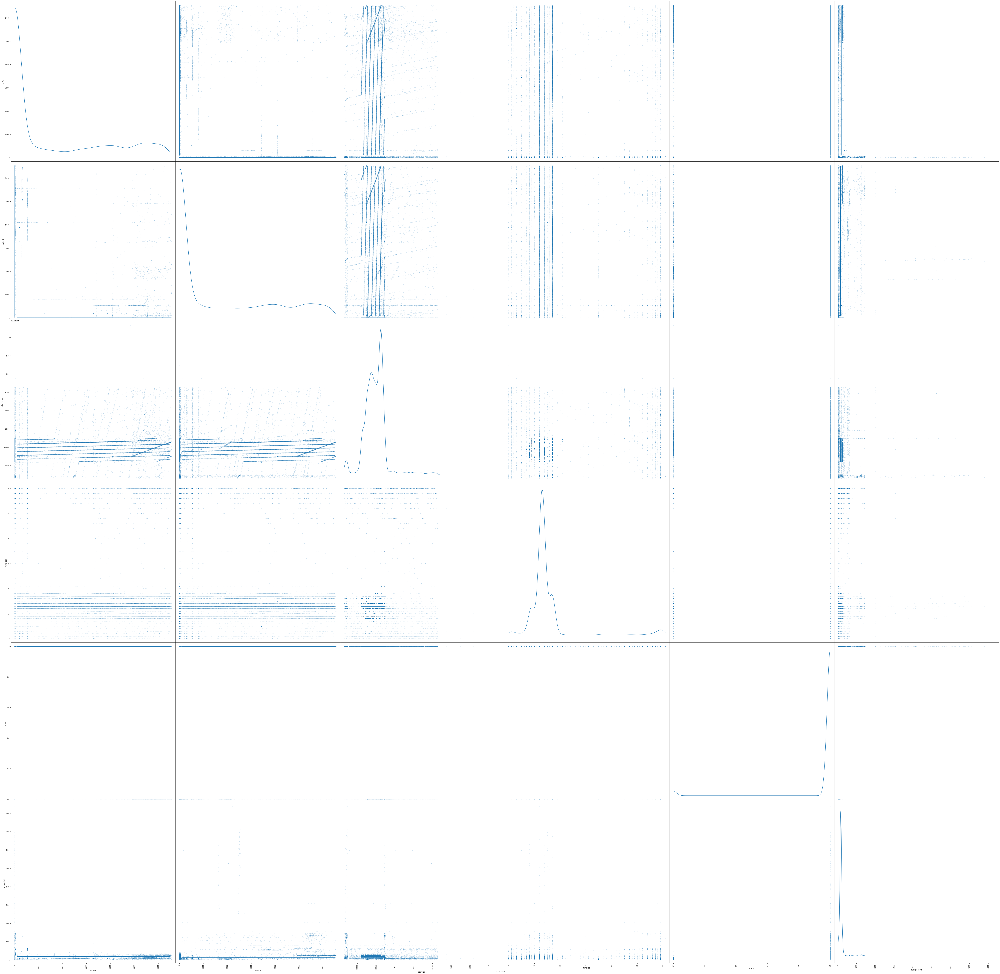

In [5]:
fig = scatter_matrix(df.sample(frac=0.05), alpha=0.2,figsize=(100,100), diagonal="kde")  

PCA Analysis to determine most important characteristics to describe data. PCA Analysis seeks to maintain the "distance" between points in as few features as possible. From this analysis, all 8 selected features are independent. This could indicate that our features do not describe our data well and instead, more features should be relations between features such as frequency of a certain signal

best n_components by PCA CV = 0
best n_components by FactorAnalysis CV = 0
best n_components by PCA MLE = 5


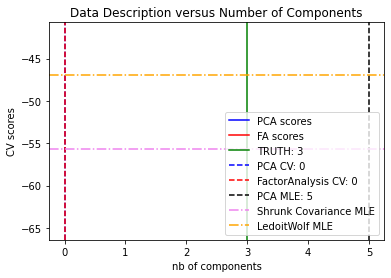

In [6]:
rank = 3
n_features = len(df.index)
n_components = np.arange(0, n_features, n_features)  # options for n_components

def compute_scores(X):
    pca = PCA(svd_solver='full')
    fa = FactorAnalysis()

    pca_scores, fa_scores = [], []
    for n in n_components:
        pca.n_components = n
        fa.n_components = n
        pca_scores.append(np.mean(cross_val_score(pca, X)))
        fa_scores.append(np.mean(cross_val_score(fa, X)))

    return pca_scores, fa_scores


def shrunk_cov_score(X):
    shrinkages = np.logspace(-2, 0, 30)
    cv = GridSearchCV(ShrunkCovariance(), {'shrinkage': shrinkages})
    return np.mean(cross_val_score(cv.fit(X).best_estimator_, X))


def lw_score(X):
    return np.mean(cross_val_score(LedoitWolf(), X))


X = df.sample(frac=0.5).values  # Reduce the number of points by selecting 5% of the data. Analysis should hold
pca_scores, fa_scores = compute_scores(X)
n_components_pca = n_components[np.argmax(pca_scores)]
n_components_fa = n_components[np.argmax(fa_scores)]

pca = PCA(svd_solver='full', n_components='mle')
pca.fit(X)
n_components_pca_mle = pca.n_components_

print("best n_components by PCA CV = %d" % n_components_pca)
print("best n_components by FactorAnalysis CV = %d" % n_components_fa)
print("best n_components by PCA MLE = %d" % n_components_pca_mle)

plt.figure()
plt.plot(n_components, pca_scores, 'b', label='PCA scores')
plt.plot(n_components, fa_scores, 'r', label='FA scores')
plt.axvline(rank, color='g', label='TRUTH: %d' % rank, linestyle='-')
plt.axvline(n_components_pca, color='b',
            label='PCA CV: %d' % n_components_pca, linestyle='--')
plt.axvline(n_components_fa, color='r',
            label='FactorAnalysis CV: %d' % n_components_fa,
            linestyle='--')
plt.axvline(n_components_pca_mle, color='k',
            label='PCA MLE: %d' % n_components_pca_mle, linestyle='--')

# compare with other covariance estimators
plt.axhline(shrunk_cov_score(X), color='violet',
            label='Shrunk Covariance MLE', linestyle='-.')
plt.axhline(lw_score(X), color='orange',
            label='LedoitWolf MLE' % n_components_pca_mle, linestyle='-.')

plt.xlabel('nb of components')
plt.ylabel('CV scores')
plt.legend(loc='lower right')
plt.title('Data Description versus Number of Components')

plt.show()

# Machine Learning

In [7]:
x_train, x_text = train_test_split(df.values)

# Outlier Detection
Local Outlier Factor - computes a score of how unusual a given data point is. Higher LOF (color in graphs means more normal)

In [8]:
from sklearn.neighbors import LocalOutlierFactor
clf = LocalOutlierFactor()
outlier = clf.fit_predict(df.values)
score = clf.negative_outlier_factor_

In [9]:
len(score)

801175

In [10]:
df['score'] = score

In [11]:
df.head(10)

,srcPort,dstPort,startTime,timeTook,status,byte/packets,score
0,80,9622,1612980900,9,1,137.800000,-1.031245
1,80,22050,1612980900,9,1,116.400000,-0.982861
2,80,51466,1612980900,9,1,999.636364,-1.004936
3,80,49748,1612980900,9,1,996.769231,-1.089313
4,80,18681,1612980900,9,1,127.600000,-1.157383
5,80,39349,1612980900,9,1,1048.166667,-1.066884
6,80,15197,1612980900,9,1,121.600000,-1.030512
7,80,9364,1612980900,9,1,890.000000,-1.150537
8,80,23209,1612980900,9,1,1055.666667,-1.153865
9,80,2842,1612980900,9,1,127.200000,-1.040465


Estimated coefficients:
b_0 = -1.1192497170439908            
b_1 = 8.985741446181136e-18


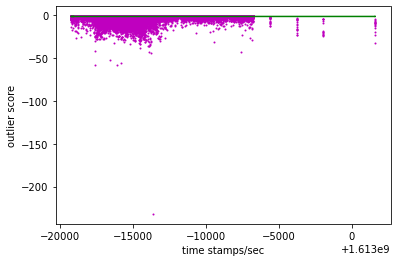

In [12]:
import numpy as np
import matplotlib.pyplot as plt


def estimate_coef(x, y):
    # number of observations/points
    n = np.size(x)
 
    # mean of x and y vector
    m_x = np.mean(x)
    m_y = np.mean(y)
 
    # calculating cross-deviation and deviation about x
    SS_xy = np.sum(y*x) - n*m_y*m_x
    SS_xx = np.sum(x*x) - n*m_x*m_x
 
    # calculating regression coefficients
    b_1 = SS_xy / SS_xx
    b_0 = m_y - b_1*m_x
 
    return (b_0, b_1)
 
def plot_regression_line(x, y, b):
    # plotting the actual points as scatter plot
    plt.scatter(x, y, color = "m",
               marker = "o", s = 1)
        # predicted response vector
    y_pred = b[0] + b[1]*x
 
    # plotting the regression line
    plt.plot(x, y_pred, color = "g")
 
    # putting labels
    plt.ylabel('outlier score')
    plt.xlabel('time stamps/sec')
 
    # function to show plot
    plt.show()
 
def main():
    # observations / data
    x = np.array(df['startTime'].tolist())
    y = np.array(df['score'].tolist())
    
    # estimating coefficients
    b = estimate_coef(x, y)
    print("Estimated coefficients:\nb_0 = {}  \
          \nb_1 = {}".format(b[0], b[1]))
    # plotting regression line
    plot_regression_line(x, y, b)
 
if __name__ == "__main__":
    main()

Plot of features and outliers as cooler colors to look for trends

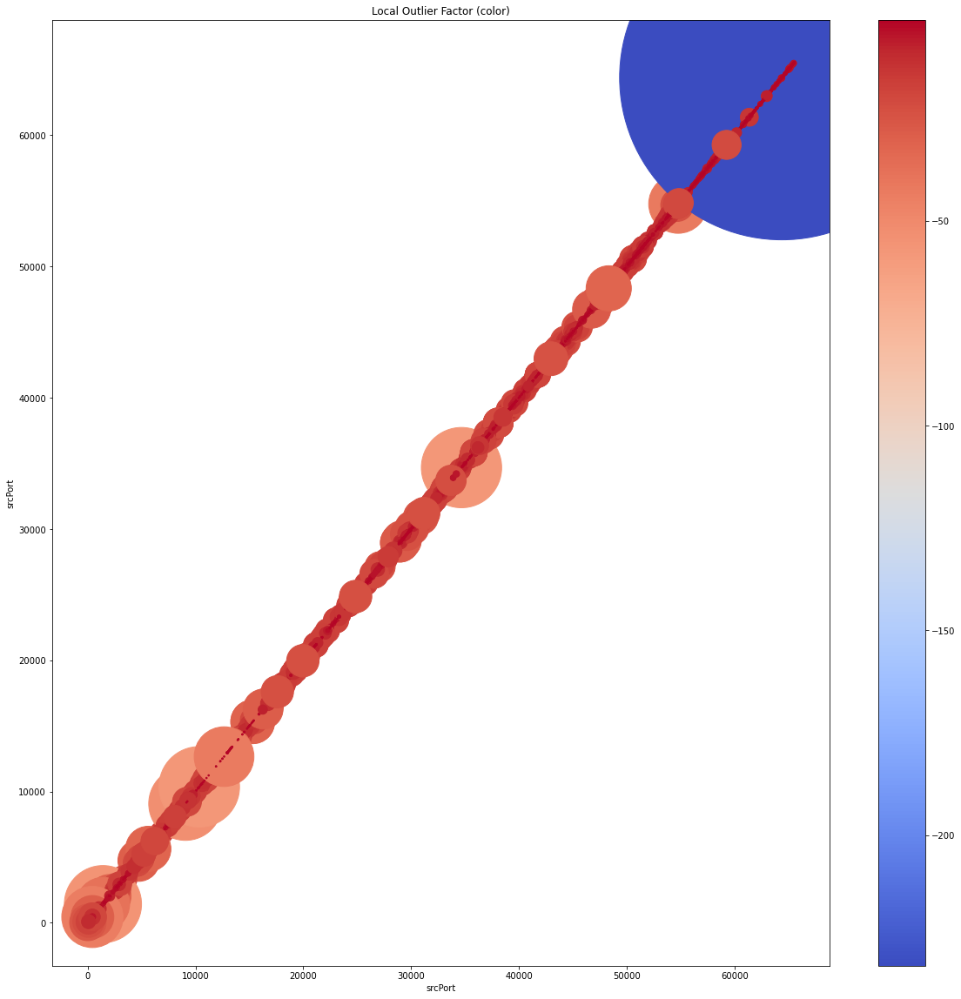

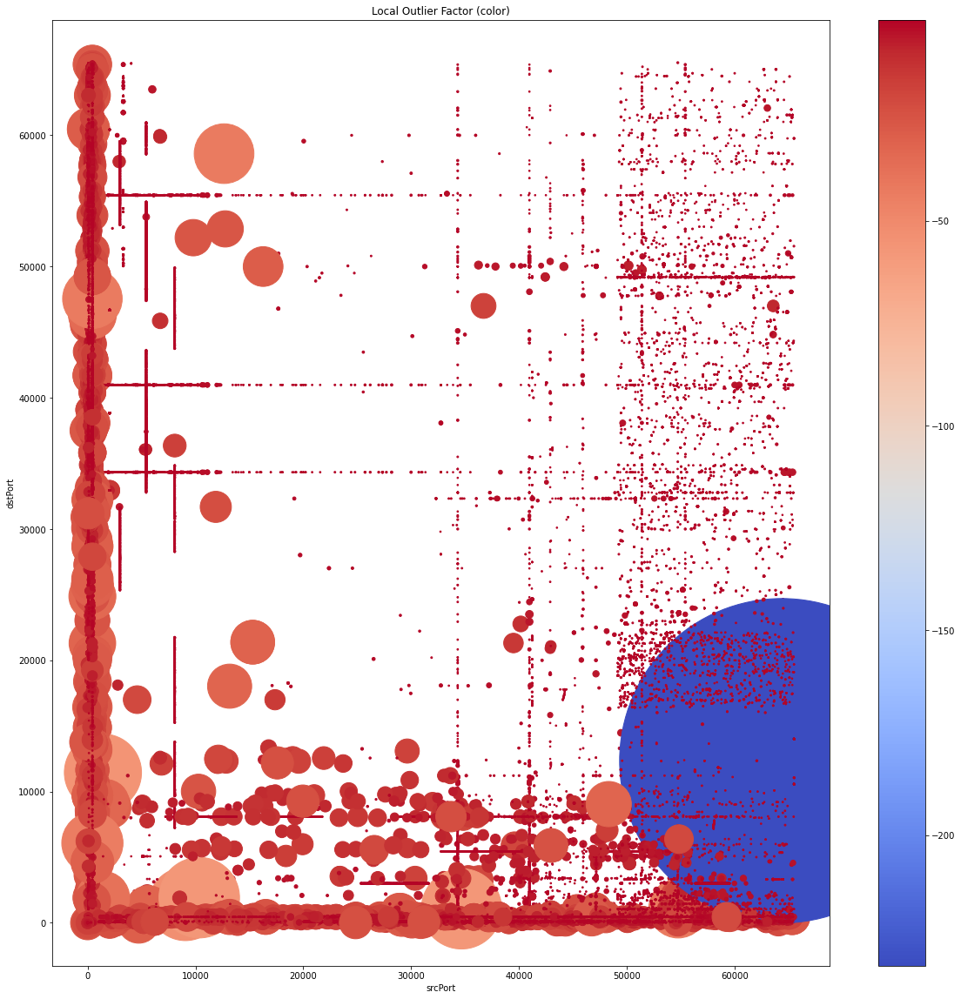

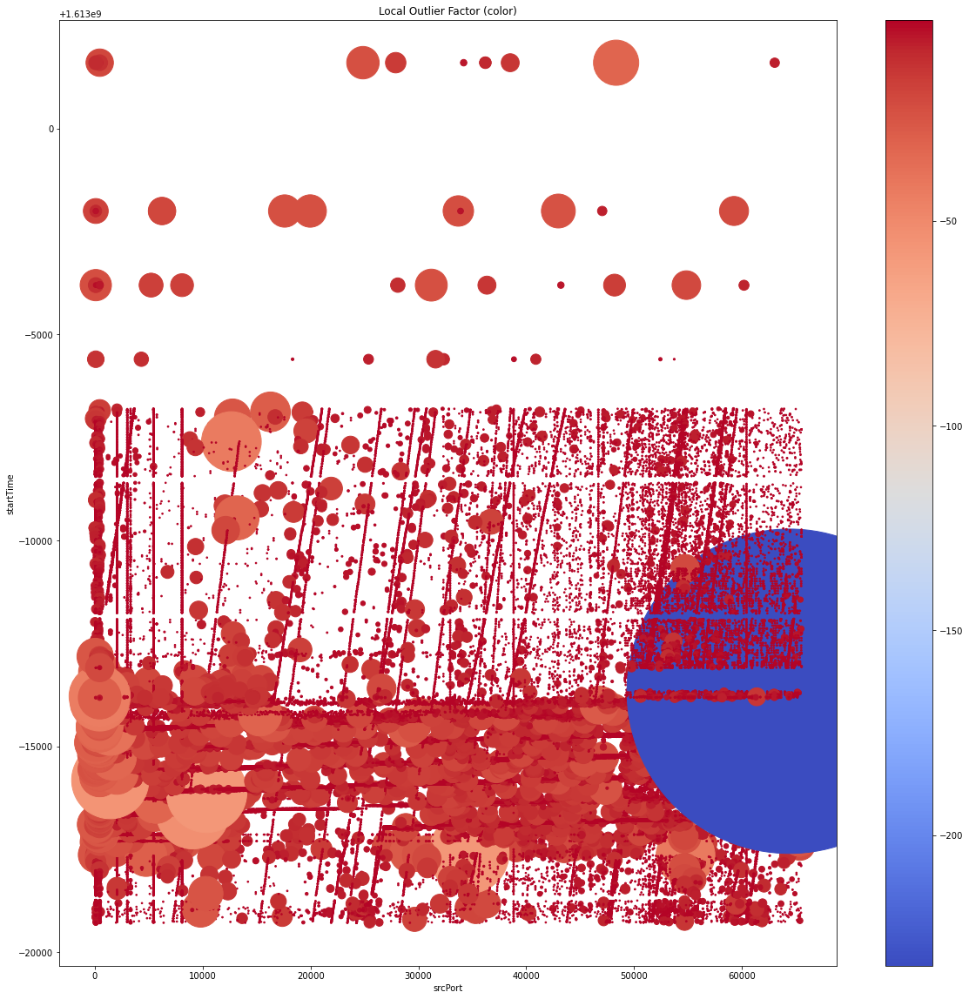

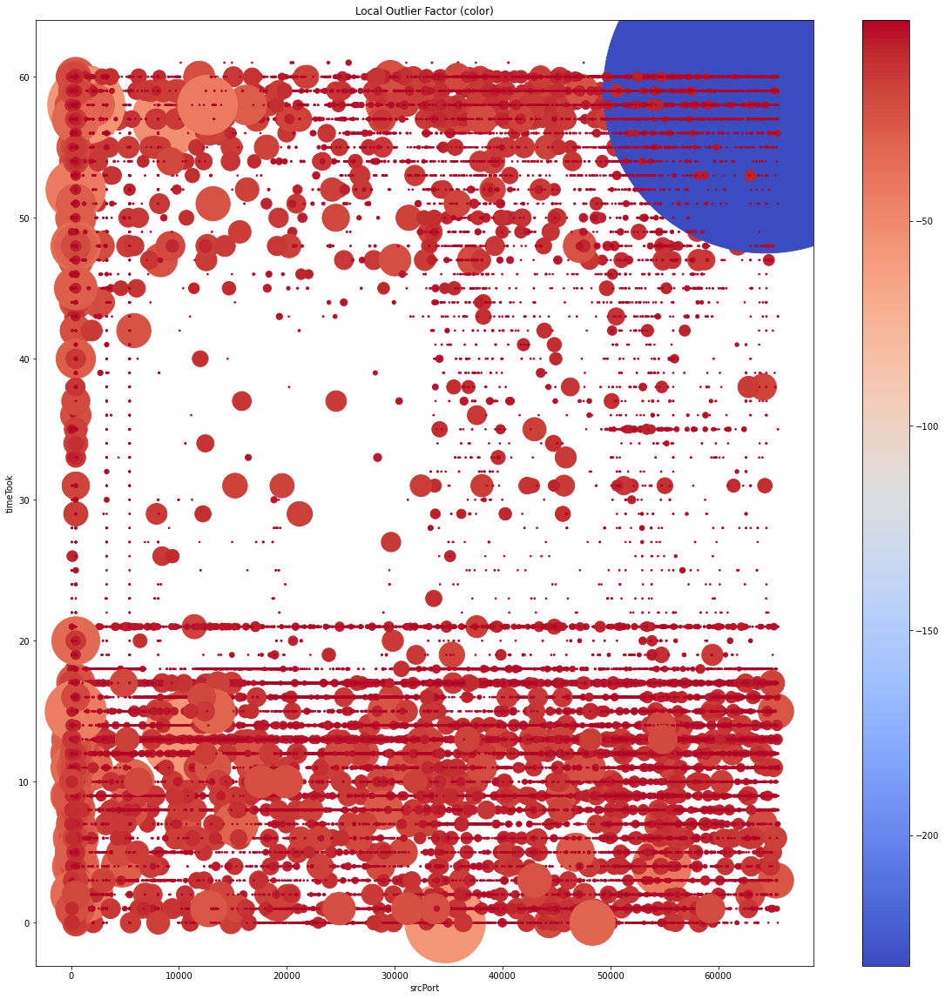

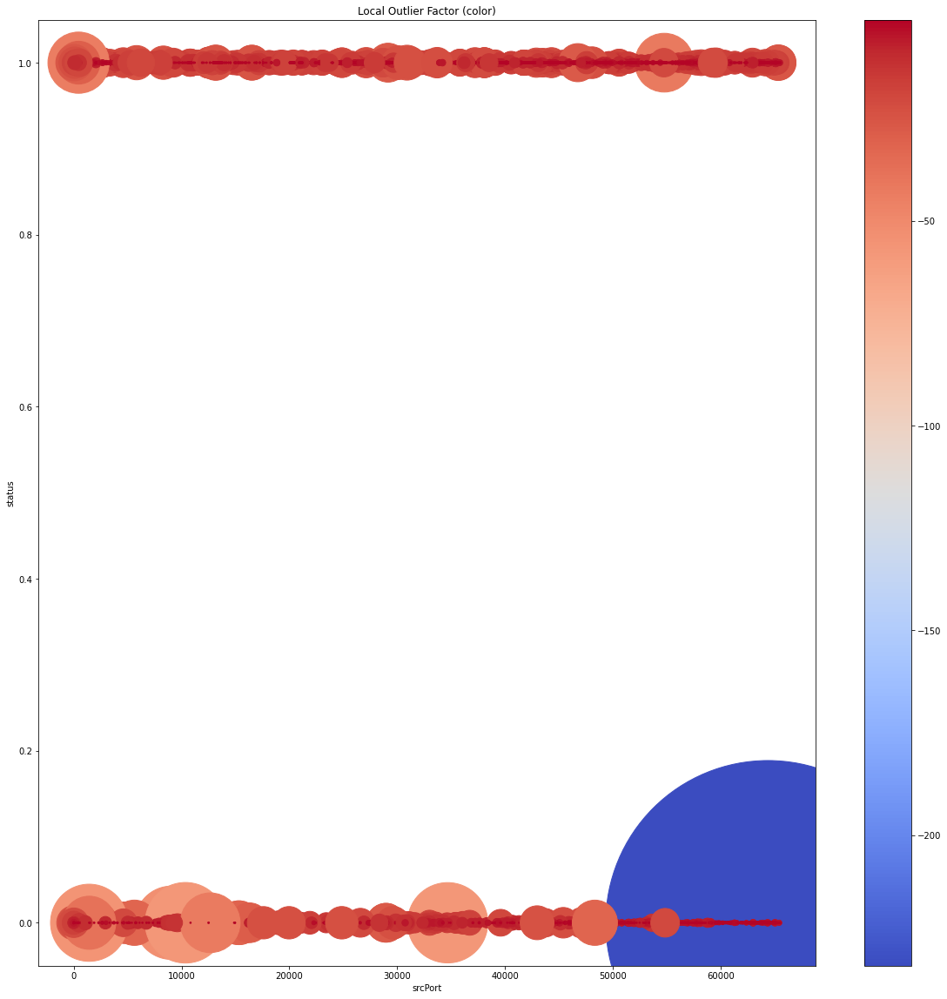

...

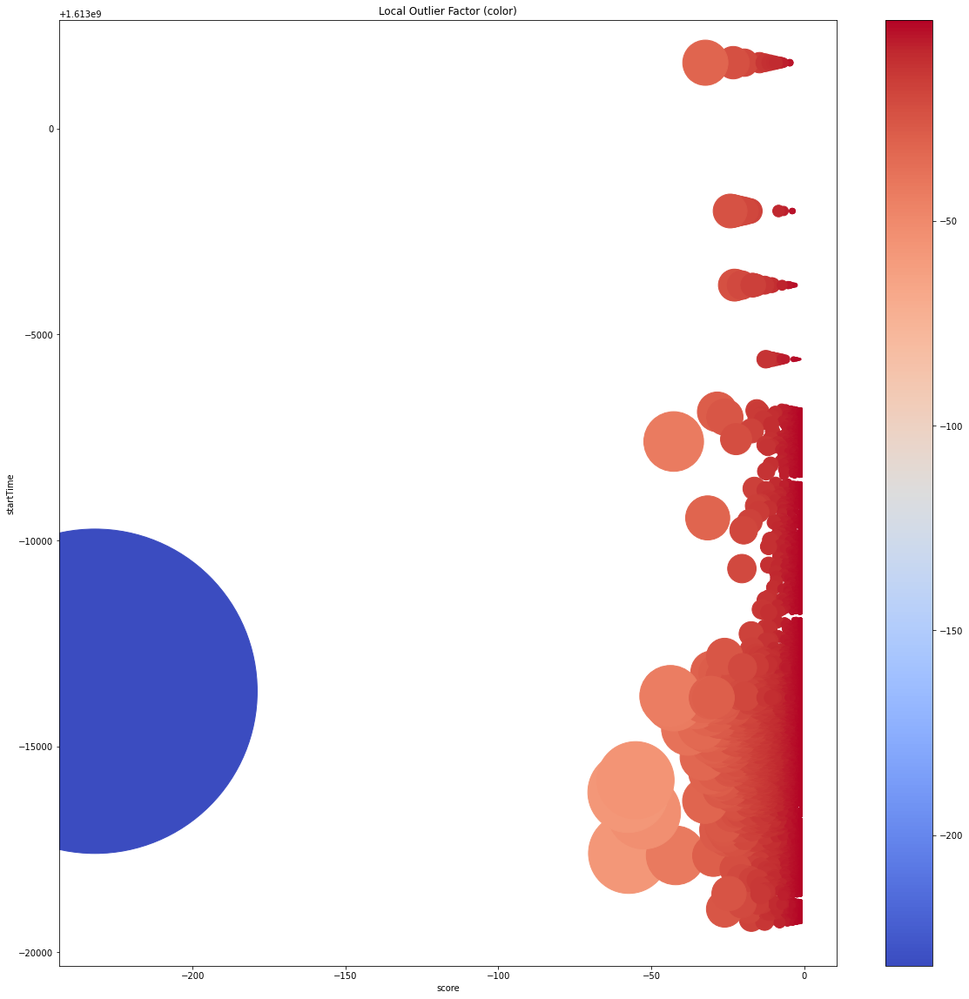

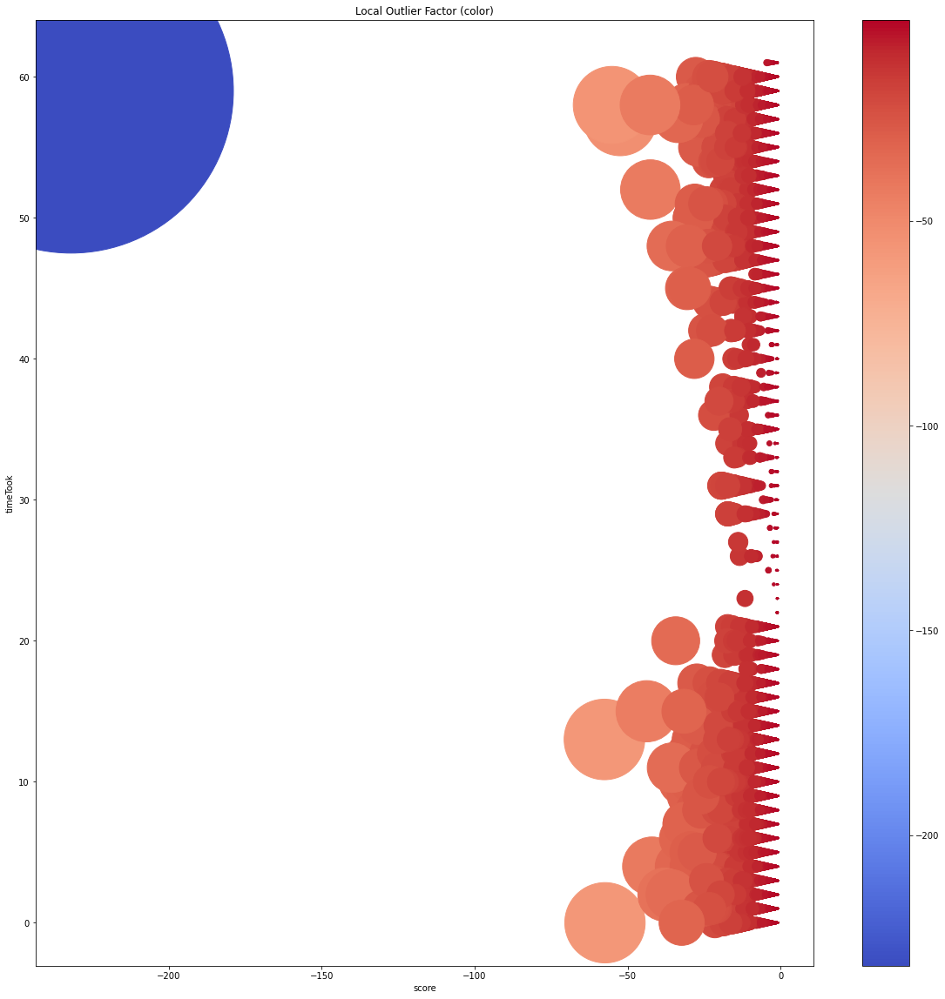

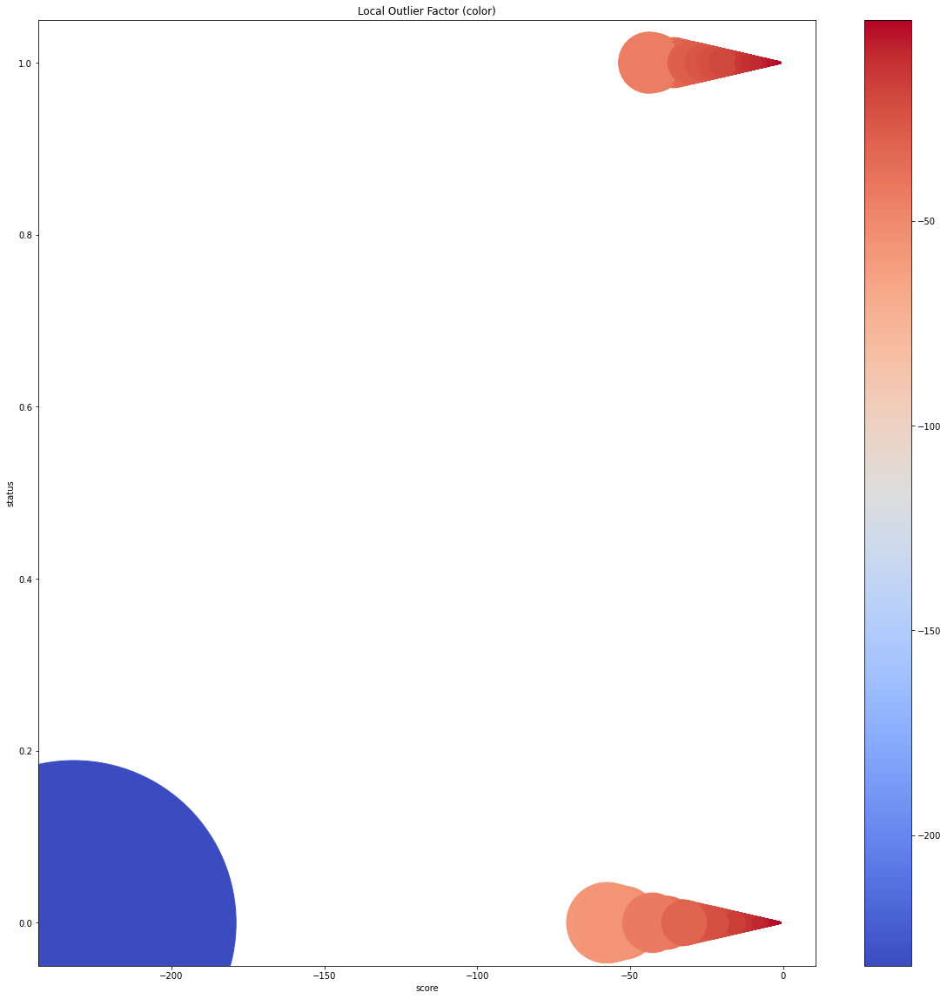

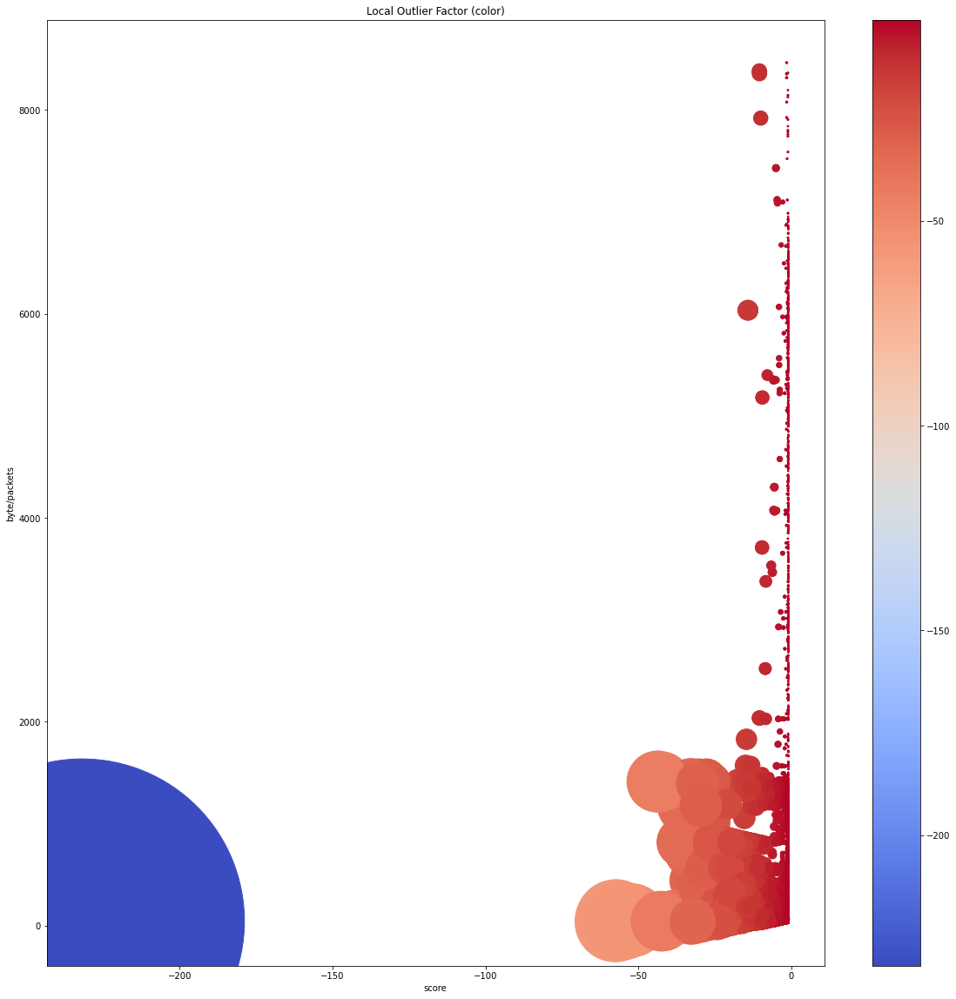

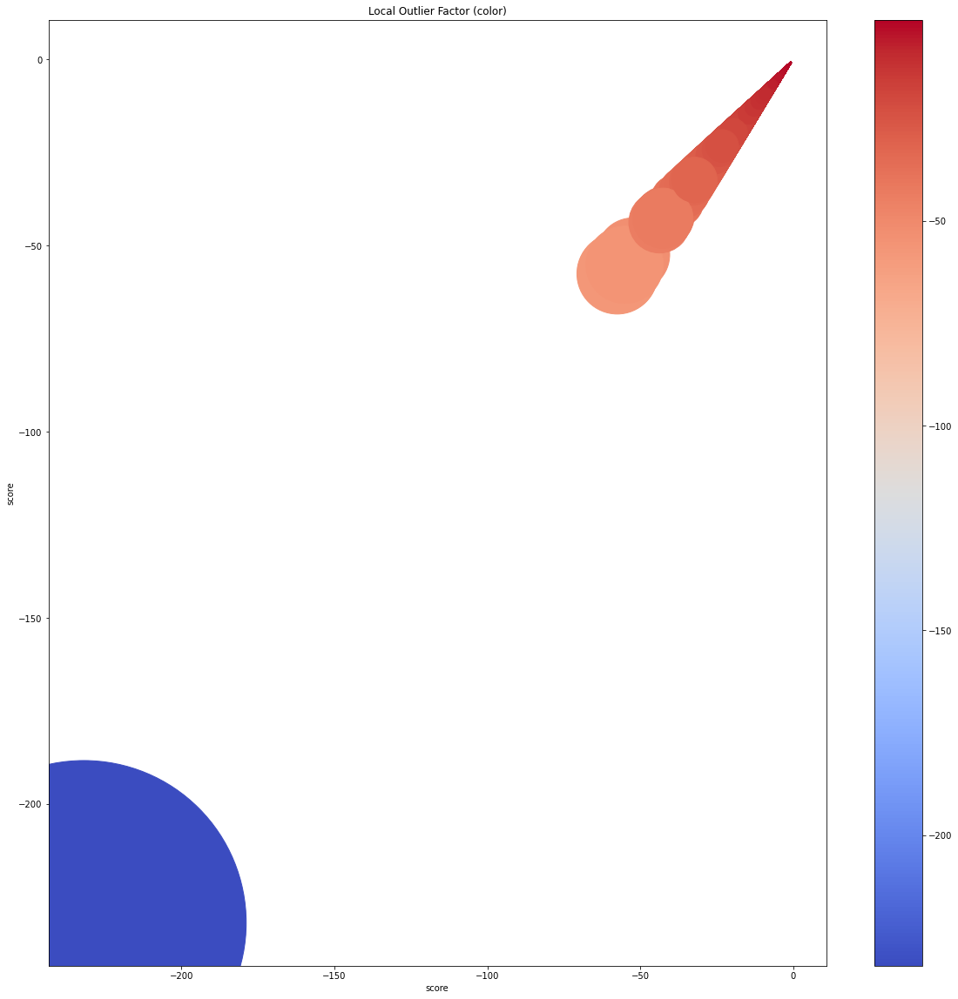

In [13]:
labels = df.columns
for i in range(len(labels)):
    for j in range(len(labels)):
        plt.figure(figsize=(20,20))
        plt.title('Local Outlier Factor (color)')
        xi = i
        yi = j
        scatter = plt.scatter(df.values[:,xi], df.values[:,yi], c=score, s=2 * (score**2)/max(score)**2, cmap='coolwarm')  
        plt.colorbar(scatter)
        plt.xlabel(labels[i])
        plt.ylabel(labels[j])
        plt.show()

### The new column 'score' is the range of the response being an outlier. The bigger the number is, the more unusual behavior the machine detects

In [22]:
df['score'] = df['score'].abs()
df['score'].std()
len(df)

801175

In [23]:
detected_responses = df[df['score']>df['score'].std()+df['score'].mean()]
len(detected_responses)

15147

In [32]:
sorted_detection = detected_responses.sort_values(by=['score'],ascending=False)
sorted_detection.head()

,srcPort,dstPort,startTime,timeTook,status,byte/packets,score
761982,64398,12345,1612986340,59,0,44.0,231.919387
166870,10356,1911,1612983888,13,0,40.0,57.581089
21909,34681,1060,1612982406,0,0,57.0,57.406054
231200,1420,11443,1612984181,58,0,44.0,55.149353
86794,9072,1433,1612983402,57,0,52.0,52.426928


In [33]:
pd.DataFrame(detected_responses).to_csv("sorted_detection.csv", index=False, header=labels)